In [1]:
# Make inline plots vector graphics
%matplotlib inline
import matplotlib_inline.backend_inline

matplotlib_inline.backend_inline.set_matplotlib_formats("pdf", "svg")

# Plotting setup
import matplotlib.pyplot as plt

# Package imports
import numpy as np
import pandas as pd
import ssl
ssl._create_default_https_context = ssl._create_unverified_context
import geopandas

In [2]:
from urllib.error import HTTPError

In [3]:
def load_taxi_data(fleets=['yellow'], years=[2021], months=[1]):
    '''
    Load TLC Trip Record Data for New York taxis
    --------------------------------------------
    INPUTS:
    
    fleets (string[]): 'yellow', 'green', 'fhv'
                           List of taxi companies whose data will be retrieved.
                           'fhv' = Uber, Lyft, etc.
    years (int[])    : 2009...2021
                           Array containing all years to be retrieved.
    months (int[])   : 1 ... 12
                           Array containing the months to be retrieved coded as integers.
    
    OUTPUT:
    
    df_trips: pandas dataframe with columns features_common (see list below).
    '''
    url_prefix = 'https://nyc-tlc.s3.amazonaws.com/trip+data/'
    features_common = ['pickup_datetime', 'dropoff_datetime', 'PULocationID', 'DOLocationID', 'fleet']
    # Empty dataframe
    df_trips = pd.DataFrame(columns=features_common)
        
    for fleet in fleets:
        for year in years:
            for month in months:
                # Create file name
                if month < 10:
                    url_data = fleet + '_tripdata_' + str(year) + '-0' + str(month) + '.csv' # Caution: Leading 0
                else:
                    url_data = fleet + '_tripdata_' + str(year) + '-' + str(month) + '.csv'
                # Try to download file
                try:
                    print('Will download... ' + url_data) # DEBUG
                    df = pd.read_csv(url_prefix + url_data, low_memory=False)
                except HTTPError:
                    print('ERROR: There is no data available for fleet={}, years={}, months={}!'.format(fleet, years, months))
                    continue
                # Set Yellow taxi dataframe columns
                if fleet == 'yellow':
                    # Features that all Yellow fleet data sets have in common
                    features = ['tpep_pickup_datetime', 'tpep_dropoff_datetime', 'PULocationID', 'DOLocationID']
                # Set Green taxi dataframe columns
                if fleet == 'green':
                    # Features that all Green fleet data sets have in common
                    features = ['lpep_pickup_datetime', 'lpep_dropoff_datetime', 'PULocationID', 'DOLocationID']
                # Set FHV dataframe columns
                if fleet == 'fhv':
                    # Features that all FHV data sets have in common
                    features = ['pickup_datetime', 'dropoff_datetime', 'PULocationID', 'DOLocationID']
                # Create dataframe => Only use relevant features and drop rest
                df.drop(columns=df.columns.difference(features), inplace=True)
                # Add column to identify fleet
                df['fleet'] = fleet
                # Standardize pick-up and drop-off columns for all fleets, i.e., rename them
                df.columns = features_common
                # Aggregate all dataframes
                df_trips = pd.concat([df_trips, df], axis=0)
    return df_trips

In [6]:
def taxi_zones_loader():
    '''
    Try to download taxi zones meta data from TLC website.
    '''
    
    url = 'https://s3.amazonaws.com/nyc-tlc/misc/taxi+_zone_lookup.csv'
    try:
        return pd.read_csv(url, low_memory=False)
    except HTTPError:
        print('ERROR: Could not access "{}"!'.format(url))

In [4]:
df_yellow_2019_01 = load_taxi_data(['yellow'], [2019], [1])

Will download... yellow_tripdata_2019-01.csv


In [5]:
df_yellow_2019_01

,pickup_datetime,dropoff_datetime,PULocationID,DOLocationID,fleet
0,2019-01-01 00:46:40,2019-01-01 00:53:20,151,239,yellow
1,2019-01-01 00:59:47,2019-01-01 01:18:59,239,246,yellow
2,2018-12-21 13:48:30,2018-12-21 13:52:40,236,236,yellow
3,2018-11-28 15:52:25,2018-11-28 15:55:45,193,193,yellow
4,2018-11-28 15:56:57,2018-11-28 15:58:33,193,193,yellow
...,...,...,...,...,...
7667787,2019-01-31 23:57:36,2019-02-01 00:18:39,263,4,yellow
7667788,2019-01-31 23:32:03,2019-01-31 23:33:11,193,193,yellow
7667789,2019-01-31 23:36:36,2019-01-31 23:36:40,264,264,yellow
7667790,2019-01-31 23:14:53,2019-01-31 23:15:20,264,7,yellow


In [7]:
df_zones_info = taxi_zones_loader()
df_zones_info.head()

,LocationID,Borough,Zone,service_zone
0,1,EWR,Newark Airport,EWR
1,2,Queens,Jamaica Bay,Boro Zone
2,3,Bronx,Allerton/Pelham Gardens,Boro Zone
3,4,Manhattan,Alphabet City,Yellow Zone
4,5,Staten Island,Arden Heights,Boro Zone


In [62]:
gdf_zones = geopandas.read_file('../dat/taxi_zones_shapefiles/taxi_zones.shp')
gdf_zones.plot()

<AxesSubplot:>

In [25]:
gdf_zones#.geometry

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((933100.918 192536.086, 933091.011 19..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((1033269.244 172126.008, 103343..."
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((1026308.770 256767.698, 1026495.593 ..."
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((992073.467 203714.076, 992068.667 20..."
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((935843.310 144283.336, 936046.565 14..."
...,...,...,...,...,...,...,...
258,259,0.126750,0.000395,Woodlawn/Wakefield,259,Bronx,"POLYGON ((1025414.782 270986.139, 1025138.624 ..."
259,260,0.133514,0.000422,Woodside,260,Queens,"POLYGON ((1011466.966 216463.005, 1011545.889 ..."
260,261,0.027120,0.000034,World Trade Center,261,Manhattan,"POLYGON ((980555.204 196138.486, 980570.792 19..."
261,262,0.049064,0.000122,Yorkville East,262,Manhattan,"MULTIPOLYGON (((999804.795 224498.527, 999824...."


## Experiments with geo data

In [34]:
# Make the results easier to read, set the names of the zone as the index
#gdf_zones = gdf_zones.set_index('zone')
#gdf_zones

In [35]:
# Measure the area of each polygon or MultiPolygon
#gdf_zones.area

In [37]:
gdf_zones.zone.unique

<bound method Series.unique of 0               Newark Airport
1                  Jamaica Bay
2      Allerton/Pelham Gardens
3                Alphabet City
4                Arden Heights
                ...           
258         Woodlawn/Wakefield
259                   Woodside
260         World Trade Center
261             Yorkville East
262             Yorkville West
Name: zone, Length: 263, dtype: object>

<AxesSubplot:>

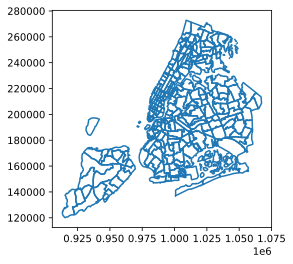

In [38]:
gdf_bounds = gdf_zones.boundary
gdf_bounds.plot()

<AxesSubplot:>

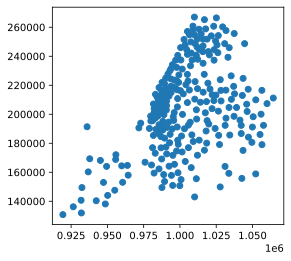

In [46]:
gdf_zones['centroid'] = gdf_zones.centroid
gdf_zones['centroid'].plot()

In [40]:
# Measure distances between points
first_point = gdf_centroids.iloc[0]
gdf_centroids.distance(first_point)

0           0.000000
1       98946.239654
2      110169.157460
3       55851.462489
4       50862.980050
           ...      
258    116520.352473
259     76623.118045
260     45079.238133
261     70098.336541
262     69442.472520
Length: 263, dtype: float64

In [43]:
# Create interactive map
gdf_zones.explore(legend=False)

In [47]:
# Layer both GeoSeries on top of each other. We just need to use one plot as an axis for the other.
ax = gdf_zones['geometry'].plot()
gdf_zones['centroid'].plot(ax=ax, color='black')

<AxesSubplot:>

In [63]:
# Make new column with copy of zones
gdf_zones['idx_zone'] = gdf_zones['zone']

# Make zones new indices but keep the zone column
gdf_zones = gdf_zones.set_index('idx_zone')

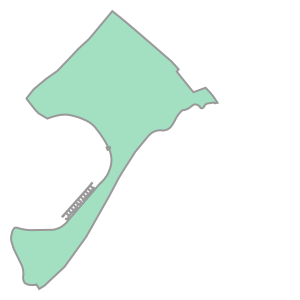

In [70]:
# get a polygon of 'Great Kills Park'
great_kills_park = gdf_zones.loc['Great Kills Park', 'geometry']
great_kills_park

In [72]:
print(type(great_kills_park))

# buffering the active geometry by 10 000 feet (geometry is already in feet)
gdf_zones["buffered"] = gdf_zones.buffer(10000) # Buffer =  all points within a given distance of each geometric object.

# check which of the geometries in gdf["buffered"] intersects it.
gdf_zones["buffered"].intersects(great_kills_park)

<class 'shapely.geometry.polygon.Polygon'>


idx_zone
Newark Airport             False
Jamaica Bay                False
Allerton/Pelham Gardens    False
Alphabet City              False
Arden Heights              False
                           ...  
Woodlawn/Wakefield         False
Woodside                   False
World Trade Center         False
Yorkville East             False
Yorkville West             False
Length: 263, dtype: bool

In [73]:
# Projection information
gdf_zones.crs

<Derived Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich